### Loading packages

In [174]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import pandas as pd
import numpy as np
import matplotlib.ticker as ticker
from sklearn import preprocessing
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn import datasets
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import tree
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
%matplotlib inline

#from sklearn.model_selection import train_test_split

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split,cross_val_score,KFold,GridSearchCV
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
import scikitplot as skplt

In [175]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import datetime as dt
from typing import Tuple

#import pdpipe as pdp

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.offline

### Defining a function to create a scatter plot of categorical variables

In [176]:
def catscatter(df,colx,coly,cols,color=['grey','black'],ratio=10,font='Helvetica',save=False,save_name='Default'):
    '''
    Goal: This function create an scatter plot for categorical variables. It's useful to compare two lists with elements in common.
    Input:
        - df: required. pandas DataFrame with at least two columns with categorical variables you want to relate, and the value of both (if it's just an adjacent matrix write 1)
        - colx: required. The name of the column to display horizontaly
        - coly: required. The name of the column to display vertically
        - cols: required. The name of the column with the value between the two variables
        - color: optional. Colors to display in the visualization, the length can be two or three. The two first are the colors for the lines in the matrix, the last one the font color and markers color.
            default ['grey','black']
        - ratio: optional. A ratio for controlling the relative size of the markers.
            default 10
        - font: optional. The font for the ticks on the matrix.
            default 'Helvetica'
        - save: optional. True for saving as an image in the same path as the code.
            default False
        - save_name: optional. The name used for saving the image (then the code ads .png)
            default: "Default"
    Output:
        No output. Matplotlib object is not shown by default to be able to add more changes.
    '''
    # Create a dict to encode the categeories into numbers (sorted)
    colx_codes=dict(zip(df[colx].sort_values().unique(),range(len(df[colx].unique()))))
    coly_codes=dict(zip(df[coly].sort_values(ascending=False).unique(),range(len(df[coly].unique()))))
    
    # Apply the encoding
    df[colx]=df[colx].apply(lambda x: colx_codes[x])
    df[coly]=df[coly].apply(lambda x: coly_codes[x])
    
    
    # Prepare the aspect of the plot
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True
    plt.rcParams['font.sans-serif']=font
    plt.rcParams['xtick.color']=color[-1]
    plt.rcParams['ytick.color']=color[-1]
    plt.box(False)

    
    # Plot all the lines for the background
    for num in range(len(coly_codes)):
        plt.hlines(num,-1,len(colx_codes)+1,linestyle='dashed',linewidth=1,color=color[num%2],alpha=0.5)
    for num in range(len(colx_codes)):
        plt.vlines(num,-1,len(coly_codes)+1,linestyle='dashed',linewidth=1,color=color[num%2],alpha=0.5)
        
    # Plot the scatter plot with the numbers
    plt.scatter(df[colx],
               df[coly],
               s=df[cols]*ratio,
               zorder=2,
               color=color[-1])
    
    # Change the ticks numbers to categories and limit them
    plt.xticks(ticks=list(colx_codes.values()),labels=colx_codes.keys(),rotation=90)
    plt.yticks(ticks=list(coly_codes.values()),labels=coly_codes.keys())
    plt.xlim(xmin=-1,xmax=len(colx_codes))
    plt.ylim(ymin=-1,ymax=len(coly_codes))
    
    # Save if wanted
    if save:
        plt.savefig(save_name+'.png')

### Data Importation and Pre-processing

In [177]:
## Reading master data 
df = pd.read_csv(r'master_1.csv') 

In [178]:
## Reading extra questions data into memory

df_extra = pd.read_csv(r'extra.csv')

In [179]:
df_extra.head()

,RespondentId,Q23. In the past 12 months have you had a permanent address?,"Q27_1:Supplemental Nutrition Assistance Program (SNAP) also known as Food StampsA program, which provides nutrition, benefits to supplement the food budget of needy families so they can purchase healthy food and move towards self-sufficiency. (fns.usda.gov)","Q27_2:Temporary Assistance for Needy Families (TANF)A program, which provides families with monthly cash/financial assistance and support services. May include childcare, job preparation, and work assistance. (benefits.gov)","Q27_3:Women Infant and Children (WIC)A program provides foods, health referrals, and nutrition education for low-income women, infants, and children up to age five who are at nutritional risk. (fns.usda.gov)","Q27_4:MedicaidA health insurance program, which provides coverage to eligible low-income adults, children, pregnant women, elderly, and people with disabilities. (medicaid.gov)","Q27_5:Social Security Income (SSI)Monthly benefits to people with limited income and resources who are disabled, blind, or age 65 or older. (ssa.gov)","Q27_6:Military/Veteran ServicesBenefits such as financial and other forms of assistance provided to veterans, their dependents, and survivors. (va.gov)",Q27_7:Unemployment BenefitsFinancial support for individuals that lost their job and meet eligibility requirements. (twc.texas.gov),Q27_8:None,...,ChallFA,EmergFood,DiffConcentrate,DelayComplDegree,TimeDelayComplDegree,RateMentalHealth,AttendProtest,AttendLocalComm,PoliticMess,CompValues
0,95772100,1,1.0,NaN,NaN,7.0,NaN,NaN,NaN,NaN,...,1 4,NaN,Almost every day,"Yes, by 2 semesters or more",Often,Poor,Never,Never,Never,Never
1,95772104,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,...,1,4,About once a week,No,Never,Good,Never,Never,Several times,A few times
2,95772110,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,...,1,NaN,About once a week,"Yes, by 2 semesters or more",Sometimes,Fair,Never,Never,Never,Once
3,95772115,1,1.0,NaN,NaN,7.0,NaN,NaN,NaN,NaN,...,1 2,NaN,About once a week,"Yes, by 1 semester",Sometimes,Good,Never,Never,Once,Never
4,95772121,1,1.0,NaN,NaN,7.0,NaN,NaN,NaN,NaN,...,1 2 3,3 4,Almost every day,"Yes, by 2 semesters or more",Often,Fair,Never,Once,Never,Never


In [180]:
new_data = df.merge(df_extra.iloc[:, [0] + list(range(42,56))], how='inner', on="RespondentId")

#### REMARK

In order to merge the data, the key "RespondentId" is used since it is the only common variable between the two data sets **master and extra**. Allow the columns conating the questions in the **extra** data was not included in the **merged data**.

In [181]:
df3 = df.copy()

In [182]:
df.head()

,Unnamed: 0,X,RespondentId,Enroll,Employ,Working,Hrs,Age,Ethnicity,Income,...,Coll_PHR,Coll_Other,Coll_NA,Gend_F,Gend_M,Gend_T,Gend_NC,Gend_Other,Gend_PNA,Gendercats
0,3,3.0,83001882,Part-time,Full-time,On campus,19 hours or less,3.0,4,"Less than $10,000",...,No,No,No,No,No,No,No,No,No,NaN
1,4,4.0,83001883,Full-time,Full-time,On campus,19 hours or less,2.0,4,"$40,000 to $49,999",...,No,No,No,No,No,No,No,No,No,NaN
2,5,5.0,83001889,Full-time,Full-time,On campus,More than 19 hours,3.0,1,"Less than $10,000",...,No,No,No,No,No,No,No,No,No,NaN
3,8,8.0,83001892,Part-time,Part-time,NaN,NaN,2.0,1,"Less than $10,000",...,No,No,No,No,No,No,No,No,No,NaN
4,9,9.0,83001893,Part-time,Part-time,NaN,NaN,2.0,1,"Less than $10,000",...,No,No,No,No,No,No,No,No,No,NaN


In [183]:
print(f'The master data comprised of {df.shape[0]} variables/columns and {df.shape[1]} observations, while the extra data has {df_extra.shape[0]} columns and {df_extra.shape[1]} obervations. In all the merged data has {new_data.shape[0]} variables and {new_data.shape[1]} observations')

The master data comprised of 11763 variables/columns and 59 observations, while the extra data has 1743 columns and 57 obervations. In all the merged data has 1743 variables and 73 observations


### Pre-processing the variable college

The column variable was casted back unto the original character values using the table below as a key

| Old Key| 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | multi-option |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| New Key | Business | Education | Engineering | Liberal Arts | Health Sciences | Nursing | Science | Pharmacy | Other | multi-option |

In [184]:
df3['College'] = df3['College'].replace(['1', '2', '3', '4', '5', '6', '7', '8', '9'], 
                                            ['Business', 'Education', 'Engineering', 'Liberal Arts',
                                             'Health Sciences', 'Nursing', 'Science', 'Pharmacy','Other'])



df3['College']=df3['College'].replace(dict.fromkeys(['2, 4', '5, 6', '2, 5', '3, 6', '6, 7', '1, 5', '3, 5', '4, 6',
       '4, 7', '3, 9', '2, 4, 7', '2, 3', '1, 4', '2, 6', '1, 2', '1, 9',
       '1, 3', '4, 9', '2, 4, 9', '2, 7', '10', '2, 8', '2, 9',
       '8, 5', '2, 10', '3, 10', '1, 7', '8, 9', '9, 10', '9, 7', '1, 10',
       '9, 5', '10, 7', '8, 7', '8, 10', '9, 10, 7', '3, 8', '1, 8, 9',
       '1, 8', '3, 7', '8, 4'], 'Multi'))

In [185]:
df3.College.unique()
print(df3.College.value_counts())

College
Health Sciences    2278
Engineering        1877
Nursing            1349
Business           1320
Liberal Arts       1114
Education          1022
Other               876
Pharmacy            679
Science             622
Multi               570
Name: count, dtype: int64


### Processing the variable Ethnicity

The ethnicity of the responders was transformed back unto the original character values using the table below as a key quide

| Old Key| 1 | 2 | 3 | 4 | 5 | 6 | 7 | multi-option |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| New Key | Hispanic | American Indian/Alaska native | Asian | African American | Native Hawaiian | White/Caucasian | Other  | Mixed |

In [186]:
df3['Ethnicity'] = df3['Ethnicity'].replace(['1', '2', '3', '4', '5', '6', '7'], 
                                            ['Hispanic', 'American Indian/Alaska native', 'Asian', 'African American',
                                             'Native Hawaiian', 'White/Caucasian', 'Other'])

df3['Ethnicity']=df3['Ethnicity'].replace(dict.fromkeys(['1, 6', '1, 4', '1, 4, 6', '3, 4', '3, 6', '1, 3, 6', '1, 6, 7',
       '1, 5', '1, 3', '1, 2, 6', '1, 7', '3, 7', '1, 2', '2, 6',
       '1, 2, 3', '3, 5', '1, 2, 4', '4, 6', '2, 4', '3, 4, 6',
       '1, 2, 3, 4, 5, 6, 7', '1, 4, 7', '1, 5, 6', '1, 2, 4, 5, 7',
       '1, 3, 4', '1, 2, 3, 6', '1, 3, 7', '1, 3, 6, 7', '1, 2, 6, 7',
       '1, 2, 7', '6, 7', '2, 3', '1, 4, 6, 7', '1, 2, 1, 6, 7',
       '2, 4, 6', '3, 1', '1, 1', '1, 11', '1, 8', '8', '11', '9', '12',
       '10', '1, 9', '9, 11', '7, 11', '13', '1, 7, 9', '8, 11', '8, 10',
       '1, 12', '8, 13', '1, 8, 11', '1, 10', '10, 11', '1, 9, 11',
       '7, 9', '1, 11, 12', '7, 8', '8, 9', '11, 12'], 'Mixed'))

In [187]:
df3.College.unique()
print(df3.Ethnicity.value_counts())

Ethnicity
Hispanic                         8893
Mixed                            1423
White/Caucasian                   685
Asian                             319
African American                  241
Other                             128
American Indian/Alaska native      50
Native Hawaiian                    20
Name: count, dtype: int64


In [188]:
df3.columns

Index(['Unnamed: 0', 'X', 'RespondentId', 'Enroll', 'Employ', 'Working', 'Hrs',
       'Age', 'Ethnicity', 'Income', 'Classification', 'College', 'Commute',
       'Alone', 'Dependents', 'HoH', 'Live', 'FedAid', 'PA', 'FreqNightElse',
       'UTEPHomeless', 'Year', 'HH3', 'HH4', 'AD1', 'AD1a', 'AD2', 'AD3',
       'index', 'Gender', 'USDAcat', 'YR_2019', 'YR_2020', 'YR_2021',
       'YR_2022', 'Ethn_Hisp', 'Ethn_AIAN', 'Ethn_Asian', 'Ethn_Black',
       'Ethn_NHPI', 'Ethn_White', 'Ethn_Other', 'Coll_BSN', 'Coll_EDU',
       'Coll_ENGN', 'Coll_HS', 'Coll_LART', 'Coll_SCI', 'Coll_NRS', 'Coll_PHR',
       'Coll_Other', 'Coll_NA', 'Gend_F', 'Gend_M', 'Gend_T', 'Gend_NC',
       'Gend_Other', 'Gend_PNA', 'Gendercats'],
      dtype='object')

### Processing the variable Gender

The gender variable was also transformed using the following key:

| Old Key| 1 | 2 | 3 | 4 | 5 | 6 | 0 | multi-option |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| New Key | Female | Male | Transgender | Gender variant | Other | Other | Other  | Transgender|

In [189]:
df3['Gender'] = df3['Gender'].replace(['1', '2', '3', '4', '5', '6', '0', '1, 3', '1, 2', '1, 1', '2, 5', '2, 4', '2, 3', '1, 4', '1, 2, 3'], 
                                            ['Female', 'Male', 'Trans', 'Gender_Variant',
                                             'Other', 'Other', 'Other', 'Trans', 'Trans', 'Trans', 'Trans', 'Trans', 'Trans', 'Trans', 'Trans'])

In [190]:
df3.Gender.unique()
print(df3.Gender.value_counts())

Gender
Female            6142
Male              2774
Gender_Variant      81
Other               56
Trans               36
Name: count, dtype: int64


## Section 1: Effects of government aids on food insecurity

#### 1.1 Federal Aid and Academic Level Relationship

In [191]:
# aggregate basis cat data for age and gender
agg_data = df.groupby(['Classification','FedAid']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'Classification': 'class', 
        'FedAid': 'aid', 
    })

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

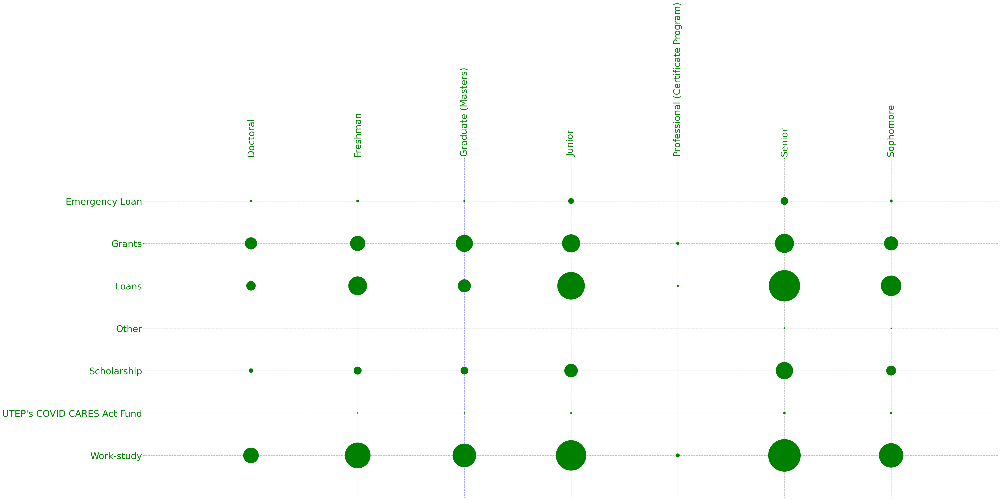

In [192]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'class', 'aid', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

In [193]:
fig = px.bar(
    agg_data, 
    x='class', 
    y='respondent_count', 
    color='aid', 
    title="UTEP Food Insecurity Respondents by Educational level and Federal Aid", 
    height=600)
fig.show()

##### Remark:

The above (upper figure) is a cluster plot of the educational levels vs the type of federal aid received by the respondents. After which, we built a category scatter plot to display the respondents for the classification-to-fedaid categorical values intersect. 

On top of the population cluster plot above, we can draw the follow conclusions:

- Work-study is predominate in all the different levels of education
- As the repondents climbs the academic levels, their reliance on loans decreases
- Very few respondents benefitted from the UTEP's COVID CARE Act fund
- The respondents hardly took the Emergency Loan
- Finally, the respondents with professional certificates did not really enrol on any of the federal aid programs

#### 1.2 Federal Aid and USDA Index  Relationship

In [194]:
# aggregate basis cat data for age and gender
agg_data = df.groupby(['USDAcat','FedAid']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'USDAcat': 'usda', 
        'FedAid': 'aid', 
    })

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

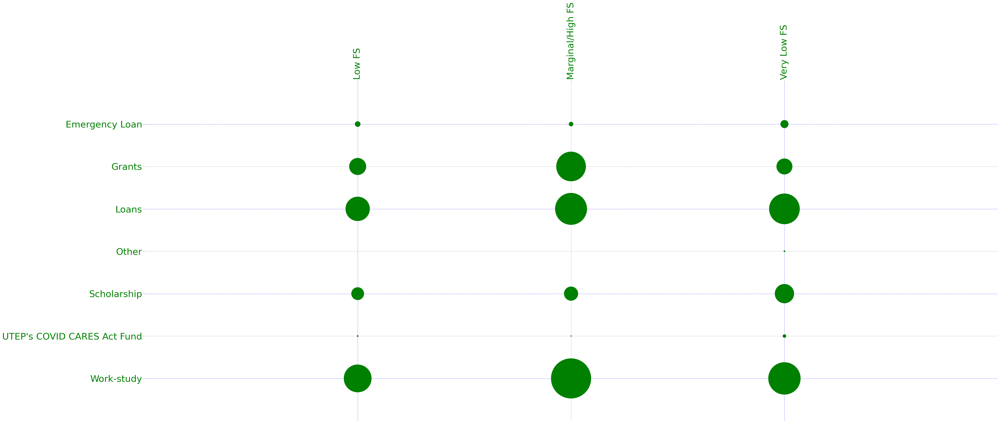

In [195]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'usda', 'aid', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

In [196]:
fig = px.bar(
    agg_data, 
    x='usda', 
    y='respondent_count', 
    color='aid', 
    title="UTEP Food Insecurity Response by USDA Index and Federal Aid", 
    height=600)
fig.show()

##### Remark:

From the cluster plot above, it can be observed that: 

- Students within the high/marginal food security, either work/study, take loans or take grants.
- Similarly, across the different USDA index, it can be observed that work-study, take loans or grants dominate the levels.



#### 1.3 Federal Aid and Ethnicity Relationship

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

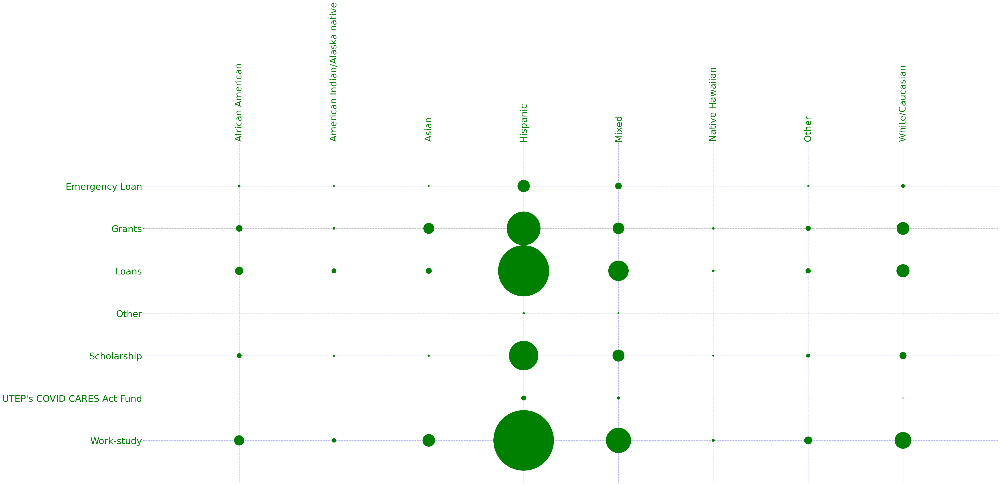

In [197]:
# aggregate basis cat data for age and gender
agg_data = df3.groupby(['Ethnicity','FedAid']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'Ethnicity': 'ethnicity', 
        'FedAid': 'aid', 
    })

# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'ethnicity', 'aid', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

In [198]:
fig = px.bar(
    agg_data, 
    x='ethnicity', 
    y='respondent_count', 
    color='aid', 
    title="UTEP Food Insecurity Response by Ethnicity and Federal Aid", 
    height=600)
fig.show()

##### Remark:

From the plots above, it can be observed that most of the respondents are Hispanic, which is not surprising since UTEP is mainly Hispanic dominated, of which most of them either work and study or takes student loans.


findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

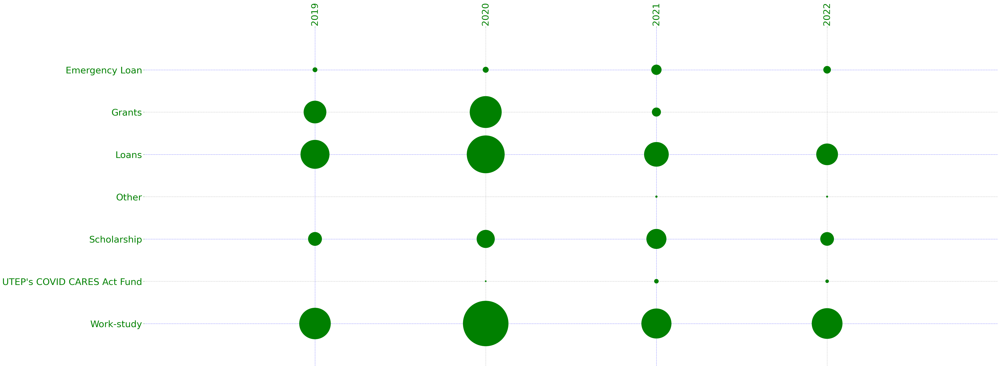

In [215]:
# aggregate basis cat data for age and gender
agg_data = df.groupby(['Year','FedAid']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'Year': 'year', 
        'FedAid': 'aid', 
    })

# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'year', 'aid', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

##### Remark:

Since the data has records across different years, we visualized the distribution of federal aids the years. It can be oberved that most students benefitted from the federal aids for 2020, which is probably duee to the COVID 19 pandemics.
Students across the differrent years, work and study followed by loans.

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

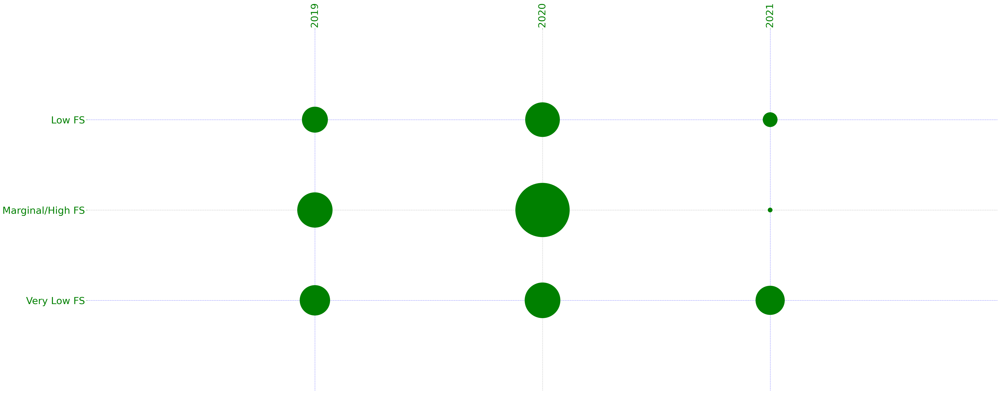

In [216]:
# aggregate basis cat data for age and gender
agg_data = df.groupby(['Year','USDAcat']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'Year': 'year', 
        'USDAcat': 'usda', 
    })

# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'year', 'usda', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

##### Remark:

Following the visualisation above, we performed analysis of the Food Insecurity as defined by the USDA index across the different years. 

It can be clearly seen that most food insecurities was observed in 2020. The amount of values recorded for 2020 is more that of the remaining years. With high/marginal food security been the most dominated category or index.

Surprisingly, the number of students within the categories dropped significantly in 2021, with very little records for marginal/high food security.



#### 1.4 Federal Aid and College Relationship

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

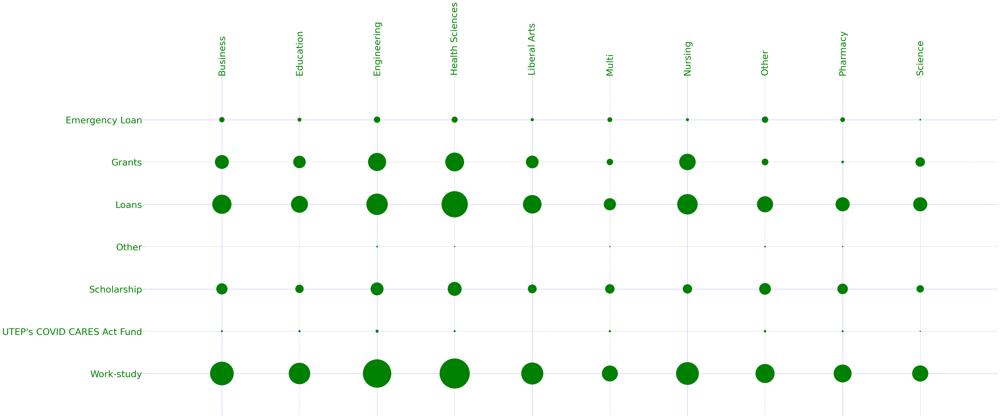

In [199]:
# aggregate basis cat data for age and gender
agg_data = df3.groupby(['College','FedAid']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'College': 'college', 
        'FedAid': 'aid', 
    })

# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'college', 'aid', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

In [200]:
fig = px.bar(
    agg_data, 
    x='college', 
    y='respondent_count', 
    color='aid', 
    title="UTEP Food Insecurity Response by College and Federal Aid", 
    height=600)
fig.show()

##### Remark:

The above (upper figure) is a cluster plot of the educational levels vs the type of federal aid received by the respondents. After which, we built a category scatter plot to display the respondents for the classification-to-fedaid categorical values intersect. 

On top of the population cluster plot above, we can draw the follow conclusions:

Work-study is predominate in all the different levels of education
As the repondents climbs the academic levels, their reliance on loans decreases
Very few respondents benefitted from the UTEP's COVID CARE Act fund
The respondents hardly took the Emergency Loan
Finally, the respondents with professional certificates did not really enrol on any of the federal aid programs

#### 1.5 Federal Aid and Gender Relationship

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

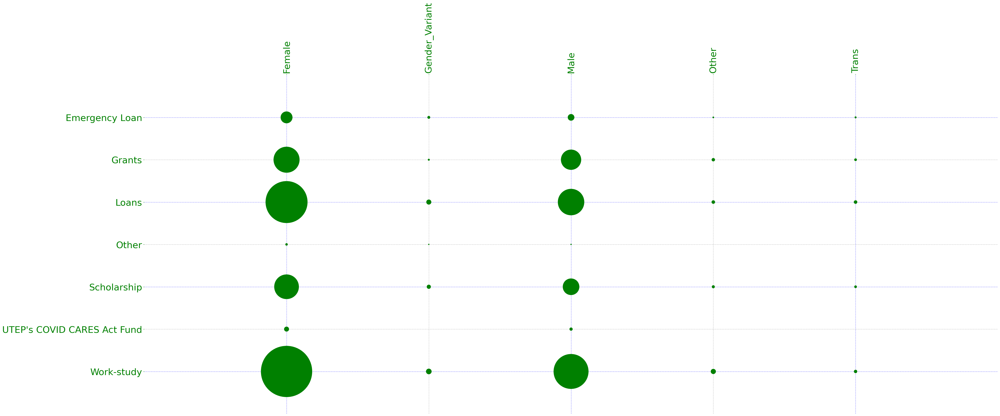

In [201]:
# aggregate basis cat data for age and gender
agg_data = df3.groupby(['Gender','FedAid']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'Gender': 'gender', 
        'FedAid': 'aid', 
    })

# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'gender', 'aid', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

In [202]:
fig = px.bar(
    agg_data, 
    x='gender', 
    y='respondent_count', 
    color='aid', 
    title="UTEP Food Insecurity Response by Gender and Federal Aid", 
    height=600)
fig.show()

## Section 2: Relationship between UDSA Index and concentration/degree completion 

Does food insecurity (as measured by USDA index or categories) have a relationship with the
items pertaining to concentration on school and degree progress/completion?

### 2.1 Relationship between USDA Index and Federal Aid based on ethnicity

In [203]:
usda_lst = ["Ethn_Hisp", "Ethn_AIAN", "Ethn_Asian", "Ethn_Black", "Ethn_NHPI", "Ethn_White", "Ethn_Other"] 

agg_data = df.groupby(['USDAcat','FedAid'])[usda_lst].count().reset_index()


agg_data = agg_data.rename(
    columns={
        'USDAcat': 'usda',
        'FedAid': 'aid',
        "Ethn_Hisp": "hispanic", 
        "Ethn_AIAN": "native", 
        "Ethn_Asian": "asian", 
        "Ethn_Black": "black", 
        "Ethn_NHPI": "hawaiian", 
        "Ethn_White": "white",
        "Ethn_Other": "other"
    })

### 2.1.1 Hispanic participation by USDA Index and Federal Aid

From the visualisation of the ethnicity, we observed that Hispanics dominated the entire survey. But to better understand distribution for the different races with regard to USDA index and federal aids, we performed individual separate visualisations for the distinct ethnicities.

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

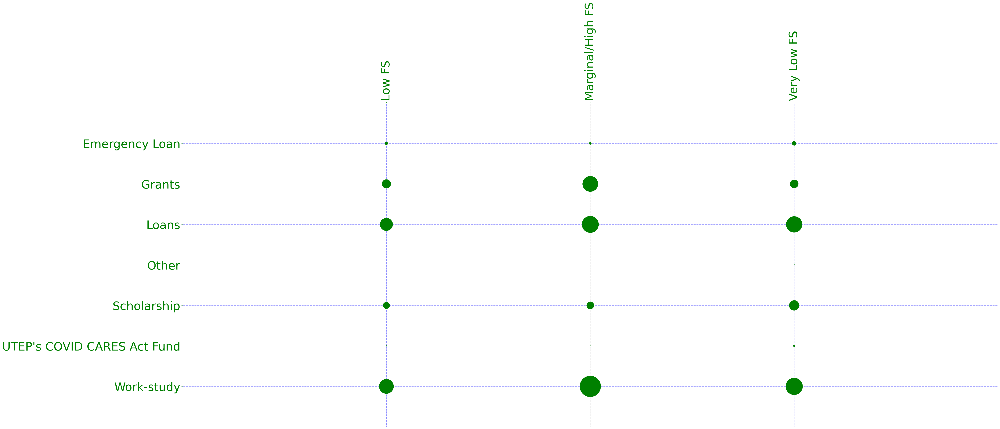

In [204]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'usda', 'aid', 'hispanic', font='Helvetica', color=colors, ratio=3)

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.show()

In [205]:
fig = px.treemap(
    agg_data, 
    path=[ 'aid', 'usda'], 
    values='hispanic', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

### 2.1.2 Black participation by USDA Index and Federal Aid

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

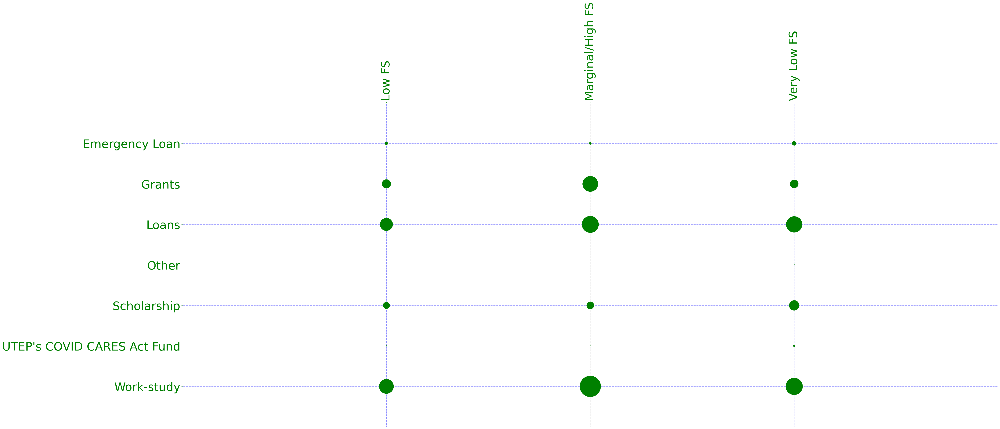

In [206]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'usda', 'aid', 'black', font='Helvetica', color=colors, ratio=3)

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.show()

In [207]:
fig = px.treemap(
    agg_data, 
    path=[ 'aid', 'usda'], 
    values='black', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

### 2.1.3 Asian participation by USDA Index and Federal Aid

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

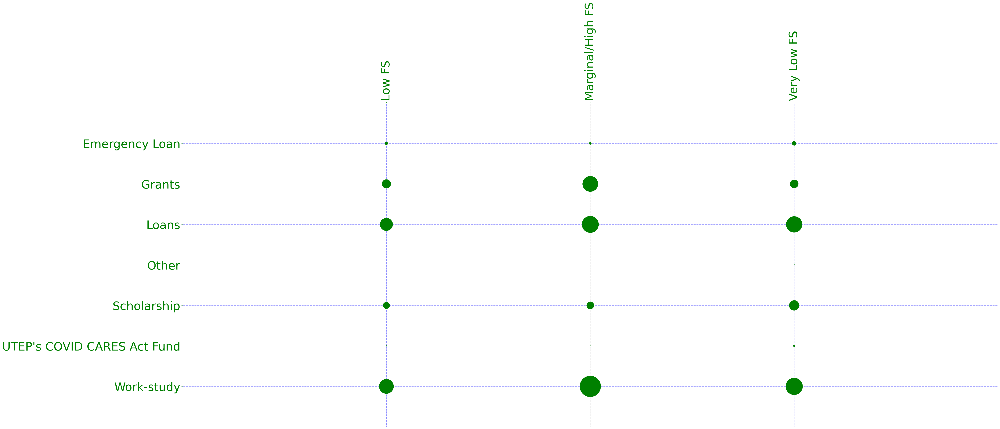

In [208]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'usda', 'aid', 'asian', font='Helvetica', color=colors, ratio=3)

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.show()

In [209]:
fig = px.treemap(
    agg_data, 
    path=[ 'aid', 'usda'], 
    values='asian', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

### 2.1.4 White participation by USDA Index and Federal Aid

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

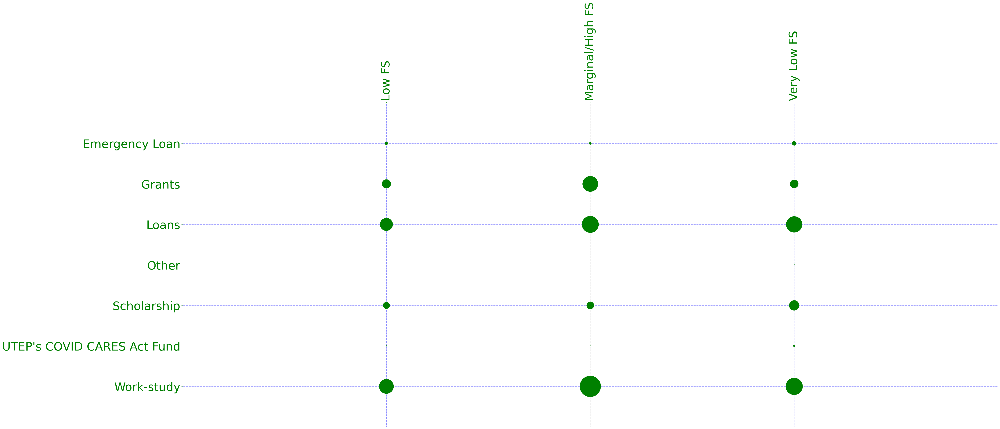

In [210]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'usda', 'aid', 'white', font='Helvetica', color=colors, ratio=3)

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.show()

In [211]:
fig = px.treemap(
    agg_data, 
    path=[ 'aid', 'usda'], 
    values='white', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

### 2.1 Relationship between USDA Index and Federal Aid based on gender

In [ ]:
# aggregate basis cat data for age and gender
agg_data = df.groupby(['Classification','FedAid']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'Classification': 'class', 
        'FedAid': 'aid', 
    })

In [ ]:
usda_lst = ["Ethn_Hisp", "Ethn_AIAN", "Ethn_Asian", "Ethn_Black", "Ethn_NHPI", "Ethn_White", "Ethn_Other"] 

agg_data = df.groupby(['USDAcat','FedAid'])[usda_lst].count().reset_index()


agg_data = agg_data.rename(
    columns={
        'USDAcat': 'usda',
        'FedAid': 'aid',
        "Ethn_Hisp": "hispanic", 
        "Ethn_AIAN": "native", 
        "Ethn_Asian": "asian", 
        "Ethn_Black": "black", 
        "Ethn_NHPI": "hawaiian", 
        "Ethn_White": "white",
        "Ethn_Other": "other"
    })

In [170]:
df.columns

Index(['Unnamed: 0', 'X', 'RespondentId', 'Enroll', 'Employ', 'Working', 'Hrs',
       'Age', 'Ethnicity', 'Income', 'Classification', 'College', 'Commute',
       'Alone', 'Dependents', 'HoH', 'Live', 'FedAid', 'PA', 'FreqNightElse',
       'UTEPHomeless', 'Year', 'HH3', 'HH4', 'AD1', 'AD1a', 'AD2', 'AD3',
       'index', 'Gender', 'USDAcat', 'YR_2019', 'YR_2020', 'YR_2021',
       'YR_2022', 'Ethn_Hisp', 'Ethn_AIAN', 'Ethn_Asian', 'Ethn_Black',
       'Ethn_NHPI', 'Ethn_White', 'Ethn_Other', 'Coll_BSN', 'Coll_EDU',
       'Coll_ENGN', 'Coll_HS', 'Coll_LART', 'Coll_SCI', 'Coll_NRS', 'Coll_PHR',
       'Coll_Other', 'Coll_NA', 'Gend_F', 'Gend_M', 'Gend_T', 'Gend_NC',
       'Gend_Other', 'Gend_PNA', 'Gendercats'],
      dtype='object')

In [ ]:
USDAcat

In [318]:
other_lst = ["Enroll", "Employ", "Working", "Hrs", "Income", "Year", "Commute", "Gender", "Classification", "USDAcat"] 

agg_data = df3.groupby(['College','FedAid'])[other_lst].count().reset_index()


agg_data = agg_data.rename(
    columns={
        'College': 'college',
        'FedAid': 'aid',
        "Enroll": "enroll", 
        "Employ": "employ", 
        "Working": "working", 
        "Hrs": "hrs", 
        "Income": "income", 
        "Year": "year",
        "Commute": "commute",
        "Gender" : "gender",
        "Classification" : "class",
        "USDAcat" : "usda"
    })

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

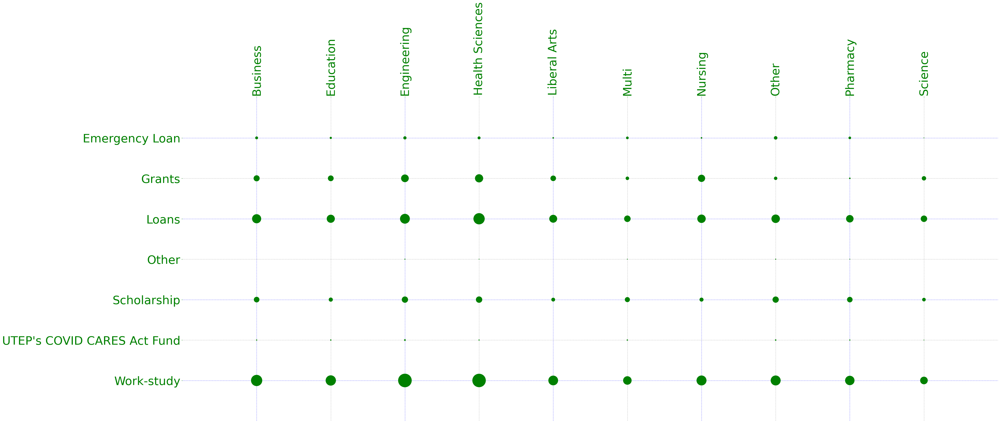

In [315]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'college', 'aid', 'gender', font='Helvetica', color=colors, ratio=3)

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.show()

In [317]:
fig = px.treemap(
    agg_data, 
    path=[ 'college', 'aid'], 
    values='gender', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

In [320]:
fig = px.treemap(
    agg_data, 
    path=[ 'college', 'aid'], 
    values='usda', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

In [323]:
other_lst = ["Enroll", "Employ", "Working", "Hrs", "Income", "Year", "Commute", "Gender", "Classification"] 

agg_data = df3.groupby(['USDAcat', 'College','FedAid'])[other_lst].count().reset_index()


agg_data = agg_data.rename(
    columns={
        'College': 'college',
        'FedAid': 'aid',
        "Enroll": "enroll", 
        "Employ": "employ", 
        "Working": "working", 
        "Hrs": "hrs", 
        "Income": "income", 
        "Year": "year",
        "Commute": "commute",
        "Gender" : "gender",
        "Classification" : "class",
        "USDAcat" : "usda"
    })

In [325]:
fig = px.treemap(
    agg_data, 
    path=['usda', 'college', 'aid'], 
    values='gender', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

In [326]:
other_lst = ["Enroll", "Employ", "Working", "Hrs", "Income", "Year", "Commute", "Gender", "USDAcat"] 

agg_data = df3.groupby(['Classification', 'College','FedAid'])[other_lst].count().reset_index()


agg_data = agg_data.rename(
    columns={
        'College': 'college',
        'FedAid': 'aid',
        "Enroll": "enroll", 
        "Employ": "employ", 
        "Working": "working", 
        "Hrs": "hrs", 
        "Income": "income", 
        "Year": "year",
        "Commute": "commute",
        "Gender" : "gender",
        "Classification" : "class",
        "USDAcat" : "usda"
    })

In [327]:
fig = px.treemap(
    agg_data, 
    path=['class', 'college', 'aid'], 
    values='gender', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

In [328]:
fig = px.treemap(
    agg_data, 
    path=['class', 'college'], 
    values='gender', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

In [212]:
other_lst = ["Enroll", "Employ", "Working", "Hrs", "Income", "Year", "Commute"] 

agg_data = df.groupby(['USDAcat','FedAid'])[other_lst].count().reset_index()


agg_data = agg_data.rename(
    columns={
        'USDAcat': 'usda',
        'FedAid': 'aid',
        "Enroll": "enroll", 
        "Employ": "employ", 
        "Working": "working", 
        "Hrs": "hrs", 
        "Income": "income", 
        "Year": "year",
        "Commute": "commute"
    })

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

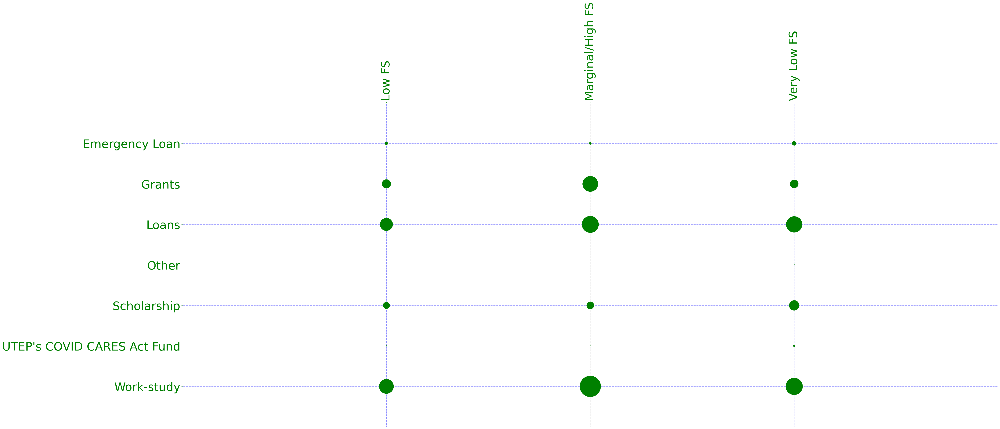

In [213]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'usda', 'aid', 'year', font='Helvetica', color=colors, ratio=3)

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.show()

In [214]:
fig = px.treemap(
    agg_data, 
    path=[ 'aid', 'usda'], 
    values='year', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

### Section 3

Are there gender or ethnicity differences in the items pertaining to concentration on school and
degree progress/completion?

In [ ]:

agg_data = df.groupby(['USDAcat','FedAid'])[usda_lst].count().reset_index()


agg_data = agg_data.rename(
    columns={
        'USDAcat': 'usda',
        'FedAid': 'aid',
        "Ethn_Hisp": "hispanic", 
        "Ethn_AIAN": "native", 
        "Ethn_Asian": "asian", 
        "Ethn_Black": "black", 
        "Ethn_NHPI": "hawaiian", 
        "Ethn_White": "white",
        "Ethn_Other": "other"
    })

In [276]:
data.columns

Index(['Unnamed: 0', 'X', 'RespondentId', 'Enroll', 'Employ', 'Working', 'Hrs',
       'Age', 'Ethnicity', 'Income', 'Classification', 'College', 'Commute',
       'Alone', 'Dependents', 'HoH', 'Live', 'FedAid', 'PA', 'FreqNightElse',
       'UTEPHomeless', 'Year', 'HH3', 'HH4', 'AD1', 'AD1a', 'AD2', 'AD3',
       'index', 'Gender', 'USDAcat', 'YR_2019', 'YR_2020', 'YR_2021',
       'YR_2022', 'Ethn_Hisp', 'Ethn_AIAN', 'Ethn_Asian', 'Ethn_Black',
       'Ethn_NHPI', 'Ethn_White', 'Ethn_Other', 'Coll_BSN', 'Coll_EDU',
       'Coll_ENGN', 'Coll_HS', 'Coll_LART', 'Coll_SCI', 'Coll_NRS', 'Coll_PHR',
       'Coll_Other', 'Coll_NA', 'Gend_F', 'Gend_M', 'Gend_T', 'Gend_NC',
       'Gend_Other', 'Gend_PNA', 'Gendercats'],
      dtype='object')

In [295]:
# subset of raw responses with respective dimension categories as well Kaggle and Colab usage
col_subset = [
    'College',
    'Ethnicity',
    'Classification',
    'USDAcat',
    'FedAid',
    'Gend_F',
    'Gend_M',
]
kaggle_collab_df = data[col_subset]

kaggle_collab_df = kaggle_collab_df.rename(
    columns={
        'College': 'college',
        'Ethnicity': 'race',
        'Classification': 'class',
        'USDAcat': 'usdacat',
        'FedAid' : 'aid',
        'Gend_F' : 'female',
        'Gend_M': 'male',
})

kaggle_collab_df['female'] = kaggle_collab_df['female'].map({'Yes': 1, 'No': 0})
kaggle_collab_df['male'] = kaggle_collab_df['male'].map({'Yes': 1, 'No': 0})

In [296]:
kaggle_collab_df

,college,race,class,usdacat,aid,female,male
0,Health Sciences,African American,Senior,Low FS,Loans,0,0
1,Business,African American,Senior,Low FS,Work-study,0,0
2,Engineering,Hispanic,Doctoral,NaN,Grants,0,0
3,Science,Hispanic,Junior,Low FS,Loans,0,0
4,Liberal Arts,Hispanic,Sophomore,Marginal/High FS,Loans,0,0
...,...,...,...,...,...,...,...
11758,Other,Hispanic,Senior,NaN,Scholarship,0,1
11759,Health Sciences,Hispanic,Graduate (Masters),NaN,Work-study,0,1
11760,Health Sciences,Hispanic,Freshman,NaN,Work-study,0,1
11761,Pharmacy,Mixed,Graduate (Masters),NaN,Work-study,0,0


In [ ]:
kaggle_collab_df.loc[kaggle_collab_df['female'] == ' female ', 'female'] = '1'


In [298]:
# drop records with NA in dimensional values
kaggle_collab_df = kaggle_collab_df.dropna(subset=['college', 'race', 'class', 'usdacat'])

# impute NA values for Kaggle and Colab usage
kaggle_collab_df['female'] = kaggle_collab_df['female'].fillna('0')
kaggle_collab_df['male'] = kaggle_collab_df['male'].fillna('0')

# replacce existing non-NaN values with '1'
kaggle_collab_df.loc[kaggle_collab_df['female'] == ' female ', 'female'] = '1'
kaggle_collab_df.loc[kaggle_collab_df['male'] == ' male ', 'male'] = '1'

# cast "Kaggle" and "Colab" to int to make use of alluvial diagrams down the road
kaggle_collab_df[["male", "female"]] = kaggle_collab_df[["male", "female"]].apply(pd.to_numeric)

In [299]:
kaggle_collab_df.columns

Index(['college', 'race', 'class', 'usdacat', 'aid', 'female', 'male'], dtype='object')

In [301]:
dimension_cats = ['college', 'race', 'class', 'usdacat', 'aid']
fig = px.parallel_categories(kaggle_collab_df, dimensions=dimension_cats, color='female')
fig.show()

In [305]:
dimension_cats = ['race', 'college', 'class', 'aid', 'usdacat']
fig = px.parallel_categories(kaggle_collab_df, dimensions=dimension_cats, color='female')
fig.show()

In [302]:
dimension_cats = ['college', 'race', 'class', 'usdacat', 'aid']
fig = px.parallel_categories(kaggle_collab_df, dimensions=dimension_cats, color='male')
fig.show()

In [303]:
dimension_cats = ['race', 'college', 'class', 'aid', 'usdacat']
fig = px.parallel_categories(kaggle_collab_df, dimensions=dimension_cats, color='male')
fig.show()

In [ ]:
colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'gender', 'aid', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

In [ ]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'sd_experience', 'occupation', 'Python', font='Helvetica', color=colors, ratio=3)

plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.show()

In [ ]:
fig = px.treemap(
    agg_data, 
    path=[ 'occupation', 'sd_experience'], 
    values='Python', 
    #color='Python', 
    color_continuous_midpoint=50, 
    color_continuous_scale=px.colors.diverging.Portland
    )
fig.show()

In [150]:
# aggregate basis cat data for age and gender
agg_data = df3.groupby(['College','FedAid']).size().reset_index(name='respondent_count')

agg_data = agg_data.rename(
    columns={
        'College': 'college', 
        'FedAid': 'aid', 
    })

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

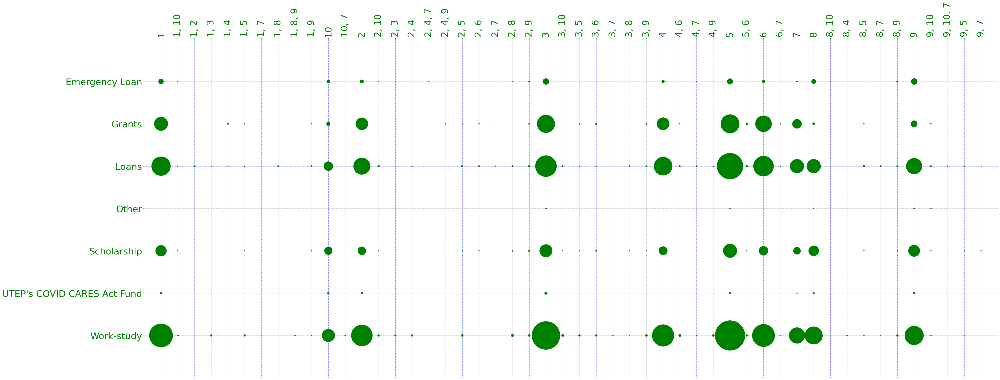

In [27]:
# this will prevent manifesting a little bug of catscatter 
# casting age and gender to int64 as a result of the catscatter plotting below
agg_data_copy = agg_data.copy() 


#plot it

colors=['blue', 'grey', 'green']
# create the plot
plt.figure(figsize=(50,20))
catscatter(agg_data_copy , 'college', 'aid', 'respondent_count', font='Helvetica', color=colors, ratio=10)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

In [35]:
df3.loc[df3['Ethnicity']  ="1", 'Ethnicity'] = "Hispanic"

SyntaxError: invalid syntax (1572280302.py, line 1)

In [70]:
df3 = df.copy()

In [71]:
df3.Ethnicity.unique().size

70

In [72]:
print(df3.Ethnicity.value_counts())

Ethnicity
1          8893
6           685
1, 6        659
3           319
4           241
           ... 
2, 4          1
1, 2, 4       1
1, 5          1
3, 4          1
11, 12        1
Name: count, Length: 69, dtype: int64


In [73]:
df3.Ethnicity.unique()

array(['4', '1', '3', '6', '5', '7', '2', nan, '1, 6', '1, 4', '1, 4, 6',
       '3, 4', '3, 6', '1, 3, 6', '1, 6, 7', '1, 5', '1, 3', '1, 2, 6',
       '1, 7', '3, 7', '1, 2', '2, 6', '1, 2, 3', '3, 5', '1, 2, 4',
       '4, 6', '2, 4', '3, 4, 6', '1, 2, 3, 4, 5, 6, 7', '1, 4, 7',
       '1, 5, 6', '1, 2, 4, 5, 7', '1, 3, 4', '1, 2, 3, 6', '1, 3, 7',
       '1, 3, 6, 7', '1, 2, 6, 7', '1, 2, 7', '6, 7', '2, 3',
       '1, 4, 6, 7', '1, 2, 1, 6, 7', '2, 4, 6', '3, 1', '1, 1', '1, 11',
       '1, 8', '8', '11', '9', '12', '10', '1, 9', '9, 11', '7, 11', '13',
       '1, 7, 9', '8, 11', '8, 10', '1, 12', '8, 13', '1, 8, 11', '1, 10',
       '10, 11', '1, 9, 11', '7, 9', '1, 11, 12', '7, 8', '8, 9',
       '11, 12'], dtype=object)

In [75]:
df3['Ethnicity'] = df3['Ethnicity'].replace(['1', '2', '3', '4', '5', '6', '7'], 
                                            ['Hispanic', 'American Indian/Alaska native', 'Asian', 'African American',
                                             'Native Hawaiian', 'White/Caucasian', 'Other'])

df3['Ethnicity']=df3['Ethnicity'].replace(dict.fromkeys(['1, 6', '1, 4', '1, 4, 6', '3, 4', '3, 6', '1, 3, 6', '1, 6, 7',
       '1, 5', '1, 3', '1, 2, 6', '1, 7', '3, 7', '1, 2', '2, 6',
       '1, 2, 3', '3, 5', '1, 2, 4', '4, 6', '2, 4', '3, 4, 6',
       '1, 2, 3, 4, 5, 6, 7', '1, 4, 7', '1, 5, 6', '1, 2, 4, 5, 7',
       '1, 3, 4', '1, 2, 3, 6', '1, 3, 7', '1, 3, 6, 7', '1, 2, 6, 7',
       '1, 2, 7', '6, 7', '2, 3', '1, 4, 6, 7', '1, 2, 1, 6, 7',
       '2, 4, 6', '3, 1', '1, 1', '1, 11', '1, 8', '8', '11', '9', '12',
       '10', '1, 9', '9, 11', '7, 11', '13', '1, 7, 9', '8, 11', '8, 10',
       '1, 12', '8, 13', '1, 8, 11', '1, 10', '10, 11', '1, 9, 11',
       '7, 9', '1, 11, 12', '7, 8', '8, 9', '11, 12'], 'Mixed'))

array(['African American', 'Hispanic', 'Asian', 'White/Caucasian',
       'Native Hawaiian', 'Other', 'American Indian/Alaska native', nan,
       'other'], dtype=object)

In [77]:
df3.Ethnicity.unique()
print(df3.Ethnicity.value_counts())

Ethnicity
Hispanic                         8893
other                            1423
White/Caucasian                   685
Asian                             319
African American                  241
Other                             128
American Indian/Alaska native      50
Native Hawaiian                    20
Name: count, dtype: int64


In [243]:
data = df3.copy()
#data = data['RespondentId'].astype(object)
q5_order = ['Loans', 'Work-study', 'Grants', 'Scholarship', 'Emergency Loan',
       "UTEP's COVID CARES Act Fund", 'Other']

q15_order = ['Low FS', 'Marginal/High FS', 'Very Low FS']



data_q5q15 = pd.pivot_table(data, values='RespondentId', index=['FedAid'], columns=['USDAcat'], aggfunc=np.sum).fillna(0).astype(int).loc[q5_order, q15_order].stack()
data_q5q15_man = pd.pivot_table(data[data['Gender']=='Male'], values='RespondentId', index=['FedAid'], columns=['USDAcat'], aggfunc=np.sum).fillna(0).astype(int).loc[q5_order, q15_order].stack()
data_q5q15_woman = pd.pivot_table(data[data['Gender']=='Female'], values='RespondentId', index=['FedAid'], columns=['USDAcat'], aggfunc=np.sum).fillna(0).astype(int).loc[q5_order, q15_order].stack()


In [228]:
fed_aid = ['Loans', 'Work-study', 'Grants', 'Scholarship', 'Emergency Loan',
       "UTEP's COVID CARES Act Fund", 'Other']

usdacat = ['Low FS', 'Marginal/High FS', 'Very Low FS']



data_q5q15 = pd.pivot_table(df, values='RespondentId', index=['FedAid'], columns=['USDAcat'], aggfunc=np.sum).fillna(0).astype(int).loc[fed_aid, usdacat].stack()
data_q5q15_man = pd.pivot_table(df3[df3['Gender']=='Male'], values='RespondentId', index=['FedAid'], columns=['USDAcat'], aggfunc=np.sum).fillna(0).astype(int).loc[fed_aid, usdacat].stack()
data_q5q15_woman = pd.pivot_table(df3[df3['Gender']=='Female'], values='RespondentId', index=['FedAid'], columns=['USDAcat'], aggfunc=np.sum).fillna(0).astype(int).loc[fed_aid, usdacat].stack()



In [244]:
def drawPieMarker(xs, ys, ratios, sizes, colors, ax):
    markers = []
    previous = 0
    # calculate the points of the pie pieces
    for color, ratio in zip(colors, ratios):
        this = 2 * np.pi * ratio + previous
        x  = [0] + np.cos(np.linspace(previous, this, 30)).tolist() + [0]
        y  = [0] + np.sin(np.linspace(previous, this, 30)).tolist() + [0]
        xy = np.column_stack([x, y])
        previous = this
        markers.append({'marker':xy, 's':np.abs(xy).max()**2*np.array(sizes), 'facecolor':color})

    # scatter each of the pie pieces to create pies
    for marker in markers:
        ax.scatter(xs, ys, **marker, alpha=0.7)

In [251]:
ax_plot.grid(linewidth=0.2, zorder=0)        

ax_plot.set_yticklabels(q5_idx, fontfamily='serif', fontsize=15)
ax_plot.set_xticklabels(q15_idx, fontfamily='serif', fontsize=15, rotation=90)

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_23424\232900771.py:3: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_23424\232900771.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(0, 1, 'V'), Text(1, 1, 'e'), Text(2, 1, 'r')]

In [254]:
df3.columns

Index(['Unnamed: 0', 'X', 'RespondentId', 'Enroll', 'Employ', 'Working', 'Hrs',
       'Age', 'Ethnicity', 'Income', 'Classification', 'College', 'Commute',
       'Alone', 'Dependents', 'HoH', 'Live', 'FedAid', 'PA', 'FreqNightElse',
       'UTEPHomeless', 'Year', 'HH3', 'HH4', 'AD1', 'AD1a', 'AD2', 'AD3',
       'index', 'Gender', 'USDAcat', 'YR_2019', 'YR_2020', 'YR_2021',
       'YR_2022', 'Ethn_Hisp', 'Ethn_AIAN', 'Ethn_Asian', 'Ethn_Black',
       'Ethn_NHPI', 'Ethn_White', 'Ethn_Other', 'Coll_BSN', 'Coll_EDU',
       'Coll_ENGN', 'Coll_HS', 'Coll_LART', 'Coll_SCI', 'Coll_NRS', 'Coll_PHR',
       'Coll_Other', 'Coll_NA', 'Gend_F', 'Gend_M', 'Gend_T', 'Gend_NC',
       'Gend_Other', 'Gend_PNA', 'Gendercats'],
      dtype='object')

In [270]:
df3.dropna(axis=1)

,Unnamed: 0,RespondentId,Employ,FedAid,Year,YR_2019,YR_2020,YR_2021,YR_2022,Ethn_Hisp,...,Coll_NRS,Coll_PHR,Coll_Other,Coll_NA,Gend_F,Gend_M,Gend_T,Gend_NC,Gend_Other,Gend_PNA
0,3,83001882,Full-time,Loans,2019,Yes,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
1,4,83001883,Full-time,Work-study,2019,Yes,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
2,5,83001889,Full-time,Grants,2019,Yes,No,No,No,Yes,...,No,No,No,No,No,No,No,No,No,No
3,8,83001892,Part-time,Loans,2019,Yes,No,No,No,Yes,...,Yes,No,No,No,No,No,No,No,No,No
4,9,83001893,Part-time,Loans,2019,Yes,No,No,No,Yes,...,No,No,No,No,No,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11758,28570,95997981,Part-time,Scholarship,2022,No,No,No,Yes,Yes,...,No,No,Yes,No,No,Yes,No,No,No,No
11759,28571,96000664,Part-time,Work-study,2022,No,No,No,Yes,Yes,...,No,No,No,No,No,Yes,No,No,No,No
11760,28572,96001101,Part-time,Work-study,2022,No,No,No,Yes,Yes,...,No,No,No,No,No,Yes,No,No,No,No
11761,28573,96001710,Full-time,Work-study,2022,No,No,No,Yes,Yes,...,No,Yes,No,No,No,No,Yes,No,No,No


In [ ]:
testdf = pd.DataFrame(
[['Max',10,'M','a', 'x',None],
['Ma',5, 'M', 'a', None,None],
['Johan',6, 'J','o','h','a']],
index=[1, 2, 3],
columns=['First_Name','Count','a', 'b', 'c','d'])
testdf

fig=px.sunburst(testdf,path=['a','b','c','d'],values='Count')
fig.show()

In [261]:
testdf = pd.DataFrame([
    ['Max', 10, 'M', 'a', 'x', None],
    ['Ma', 5, 'M', 'a', 'd', None],
    ['Johan', 6, 'J', 'o', 'h', 'a']],
    index=[1, 2, 3],
    columns=['First_Name', 'Count', 'a', 'b', 'c', 'd'])

testdf

fig = px.sunburst(testdf, path=['a', 'b', 'c', 'd'], values='Count')
fig.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

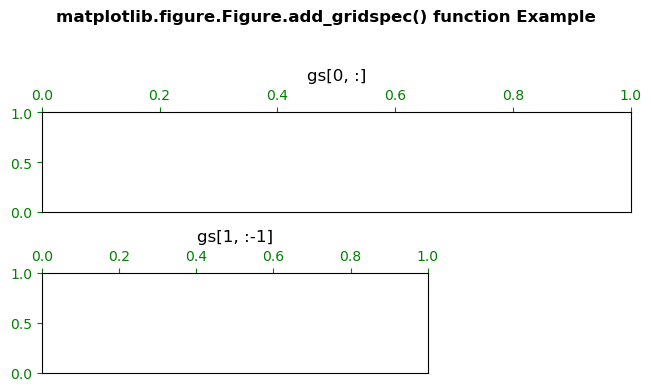

In [236]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
  
  
fig = plt.figure(constrained_layout = True)
gs = fig.add_gridspec(3, 3)
ax = fig.add_subplot(gs[0, :])
ax.set_title('gs[0, :]')
ax2 = fig.add_subplot(gs[1, :-1])
ax2.set_title('gs[1, :-1]')
  
  
fig.suptitle('matplotlib.figure.Figure.add_gridspec() \
function Example\n\n', fontweight ="bold")
  
plt.show()

In [ ]:
fig = plt.figure(figsize=(20, 23), dpi=200)

gs = fig.add_gridspec(5, 5)



ax_plot = fig.add_subplot(gs[1:4, 0:4]) 
for q5_idx in fed_aid[::-1]:
    for q15_idx in usdacat:
        man = data_q5q15_man[q5_idx][q15_idx]
        woman = data_q5q15_woman[q5_idx][q15_idx]
        tot = data_q5q15[q5_idx][q15_idx]
        drawPieMarker([q15_idx],[q5_idx], [man/(man+woman), woman/(man+woman)] ,[tot*2.5], ['#004c70', '#990000'], ax=ax_plot)

ax_plot.grid(linewidth=0.2, zorder=0)        

ax_plot.set_yticklabels(q5_idx, fontfamily='serif', fontsize=15)
ax_plot.set_xticklabels(q15_idx, fontfamily='serif', fontsize=15, rotation=90)

# Pos
ax_pos = fig.add_subplot(gs[0, :4], sharex=ax_plot) 
data_q15_woman = df[df['Gender']=='Female']['USDAcat'].value_counts()[usdacat]
ax_pos.bar(data_q15_woman.index, data_q15_woman, width=0.45, alpha=0.7, color='#990000')

data_q15_man = data[data['Gender']=='Female']['Q15'].value_counts()[q15_order]
ax_pos.bar(data_q15_man.index, data_q15_man, bottom=data_q15_woman , width=0.45, alpha=0.7, color='#004c70')

plt.setp(ax_pos.get_xticklabels(), visible=False)


# Exp
ax_exp = fig.add_subplot(gs[1:4, 4], sharey=ax_plot) 

data_q5_woman = data[data['Q2']=='Woman']['Q5'].value_counts()[q5_order]
ax_exp.barh(data_q5_woman.index[::-1], data_q5_woman[::-1], height=0.55, alpha=0.7, color='#990000')

data_q5_man = data[data['Q2']=='Man']['Q5'].value_counts()[q5_order]
ax_exp.barh(data_q5_man.index[::-1], data_q5_man[::-1], left= data_q5_woman[::-1],height=0.55, alpha=0.7, color='#004c70')

plt.setp(ax_exp.get_yticklabels(), visible=False)

# Spines
for s in ['top', 'left', 'right', 'bottom']:
    ax_plot.spines[s].set_visible(False)
    ax_pos.spines[s].set_visible(False)
    ax_exp.spines[s].set_visible(False)
    

fig.text(0.8, 0.9, 'Gender & Position & ML Experience', fontweight='bold', fontfamily='serif', fontsize=35, ha='right') 
fig.text(0.8, 0.88, 'Stacked Bar Chart + Categorical Bubble Pie Chart', fontweight='light', fontfamily='serif', fontsize=20, ha='right')
# plt.tight_layout()
plt.show()


In [226]:
df3.Gender.unique()

array([nan, 'Female', 'Gender_Variant', 'Male', 'Trans', 'Other'],
      dtype=object)

In [274]:
df3.College.unique()

array(['Health Sciences', 'Business', 'Engineering', 'Science',
       'Liberal Arts', 'Nursing', 'Education', 'Pharmacy', 'Other',
       'Multi', nan], dtype=object)

In [275]:
# splitting data into continents
survey2020_asia_df = df3[df3["College"]=="Health Sciences"]
survey2020_america_df = df3[df3["College"]=="Business"]
survey2020_europe_df = df3[df3["College"]=="Engineering"]
survey2020_africa_df = df3[df3["College"]=="Science"]
survey2020_australia_df = df3[df3["College"]=="Science"]
survey2020_others_df = df3[df3["College"]=="Nursing"]